

# 🧪 DICOM to NIfTI Conversion

We converted the Duke Breast MRI data from DICOM format (as provided by TCIA) into 3D NIfTI files. Although a mapping file was originally available on the Duke website, it was outdated. We therefore generated an updated mapping and provide the code for its application below.


In [42]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import struct
import os

import os, sys
sys.path.append(os.path.abspath(os.path.join(os.getcwd(),  'utils')))

import data_utils as ds



# image utils

In [85]:
import matplotlib.gridspec as gridspec
import matplotlib.pyplot as plt
# cb - cotrast_brightness
def show_n_images(imgs, cmap='gray', titles = None, enlarge = 4, mtitle=None,
                  cut = 0, axis_off = True, fontsize=15, cb = 0):

    plt.set_cmap(cmap);

    n = len(imgs);
    gs1 = gridspec.GridSpec(1, n);

    fig1 = plt.figure(figsize=(4*len(imgs),8));
    for i in range(n):

        ax1 = fig1.add_subplot(gs1[i]);
        if (cb):
            if len(np.unique(imgs[i])<=5):
                 img = imgs[i]
            else:

                img = cont_br(imgs[i])
        else:
            img = imgs[i]
        if cut:
            ax1.imshow(img[50:290, 75:450] , interpolation='none', origin='lower');
        else:

            ax1.imshow(img, interpolation='none');
        if (titles is not None):
            ax1.set_title(titles[i], fontsize=fontsize);  #, fontweight="bold");
        if (axis_off):
            plt.axis('off')
    if mtitle:
        plt.title(mtitle)
    plt.tight_layout()
    plt.show();
    
    
def minmax(x):
    if x.max()==0:
        return x
    x = (x-x.min())/(x.max()-x.min()).copy()
    return x

## Dicom utils

In [44]:
import os
import pydicom
import numpy as np
import pandas as pd

def read_dicom_series(folder_path):
    """
    Read DICOM series from a given folder

    Args:
    folder_path (str): Path to the folder containing DICOM files

    Returns:
    tuple: (numpy array of DICOM images, first DICOM file for metadata)
    """
    # Get all DICOM files in the folder
    dcm_files = [f for f in os.listdir(folder_path) if f.endswith('.dcm')]

    # Sort files to ensure correct order
    dcm_files.sort(key=lambda x: int(x.split('-')[-1].split('.')[0]))

    # Read DICOM files
    dicom_images = []
    for dcm_file in dcm_files:
        full_path = os.path.join(folder_path, dcm_file)
        dicom_image = pydicom.dcmread(full_path)
        dicom_images.append(dicom_image.pixel_array)

    # Convert to numpy array
    dicom_stack = np.array(dicom_images)

    return dicom_stack, dicom_image

In [45]:
import os
import pydicom
import numpy as np
import pandas as pd

def read_dicom_series_positions(folder_path):
    """
    Read DICOM series from a given folder

    Args:
    folder_path (str): Path to the folder containing DICOM files

    Returns:
    tuple: (numpy array of DICOM images, first DICOM file for metadata)
    """
    # Get all DICOM files in the folder
    dcm_files = [f for f in os.listdir(folder_path) if f.endswith('.dcm')]

    # Sort files to ensure correct order
    dcm_files.sort(key=lambda x: int(x.split('-')[-1].split('.')[0]))

    # Read DICOM files
    dcm=[]
    for dcm_file in dcm_files:
        full_path = os.path.join(folder_path, dcm_file)
        dicom_image = pydicom.dcmread(full_path)
        dcm.append(dicom_image)


    return dcm

In [46]:
def extract_voxel_sizes(dicom_image):
    """
    Extract voxel sizes from DICOM metadata

    Args:
    dicom_image (pydicom.dataset.FileDataset): DICOM image file

    Returns:
    dict: Voxel sizes in x, y, z directions
    """
    try:
        # Pixel spacing (x, y)
        pixel_spacing = dicom_image.PixelSpacing

        # Slice thickness (z)
        slice_thickness = dicom_image.SliceThickness if hasattr(dicom_image, 'SliceThickness') else None

        return {
            'voxel_x': float(pixel_spacing[0]),
            'voxel_y': float(pixel_spacing[1]),
            'voxel_z': float(slice_thickness) if slice_thickness is not None else None
        }
    except Exception as e:
        print(f"Error extracting voxel sizes: {e}")
        return {
            'voxel_x': None,
            'voxel_y': None,
            'voxel_z': None
        }

# Nifti utils

In [47]:
import nibabel as nib
def save_nifti(fname,img):

    new_nifti_image = nib.Nifti1Image(img, affine=np.eye(4))

    # Save the new NIfTI image to a 3d file
    nib.save(new_nifti_image, fname)


# Path setup

In [48]:
my_computer=True
my_colab=False
base_path = "..\..\BreastDCEDL"

In [49]:
# Check if running in Google Colab

if 'google.colab' in str(get_ipython()):
    print("Running in Google Colab")
    # Clone the repository
    !git clone https://github.com/naomifridman/BreastDCEDL.git
    !pip install pydicom

    # Change to the repository directory
    os.chdir('/content/BreastDCEDL')
    
    my_colab=True
    my_computer=False
    base_path='/content/BreastDCEDL'

In [50]:
output_nifti_path=os.path.join(base_path,"DUKE","data_samples","dce")

In [51]:
dcm_path=os.path.join(base_path,"DUKE","data_samples","dicom_tcia")

In [52]:
base_tcia_path="E:\duke\data\manifest-1607053360376\\Duke-Breast-Cancer-MRI\\"

In [53]:
base_tcia_path=dcm_path

In [54]:
os.listdir(base_tcia_path)

['Breast_MRI_001', 'Breast_MRI_002']

### TCIA directory organization
```
data/
└── manifest-1607053360376/
    └── Duke-Breast-Cancer-MRI/                                     ---------------    base_path
        ├── Breast_MRI_001/
        │   └── 01-01-1990-NA-MRI BREAST BILATERAL WWO-97538/       ---------------    raw['top_folder']
        │       ├── 3.000000-ax dyn pre-93877/                      ---------------    row['acq0']
        │       │   ├── 1-001.dcm                 
        │       │   ├── ...
        │       │   └── 1-160.dcm
        │       ├── 5.000000-ax dyn 1st pass-59529/
        │       │   ├── 1-001.dcm
        │       │   ├── ...
        │       │   └── 1-160.dcm
        │       ├── 8.000000-ax dyn 2nd pass-92755/
        │       │   ├── 1-001.dcm
        │       │   ├── ...
        │       │   └── 1-160.dcm
        │       ├── 11.000000-ax dyn 3rd pass-41458/
        │       │   ├── 1-001.dcm
        │       │   ├── ...
        │       │   └── 1-160.dcm
        │       ├── 14.000000-ax dyn 4th pass-47500/
        │       │   ├── 1-001.dcm
        │       │   ├── ...
        │       │   └── 1-160.dcm
        │       └── 26.000000-ax t1 tse c-58582/
        │           ├── 1-001.dcm
        │           ├── ...
        │           └── 1-160.dcm
        ├── Breast_MRI_002/
        ├── Breast_MRI_003/
        ├── ...
        ├── Breast_MRI_921/
        └── Breast_MRI_922/


In [55]:
df = pd.read_csv('duke_dicom_nifti_mapping.csv')

In [58]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 920 entries, 0 to 919
Data columns (total 22 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   pid           920 non-null    object 
 1   n_tp          920 non-null    int64  
 2   n_xy          920 non-null    int64  
 3   n_z           920 non-null    int64  
 4   slice_space   920 non-null    float64
 5   voxel_x       916 non-null    float64
 6   voxel_z       916 non-null    float64
 7   top_folder    920 non-null    object 
 8   file_count    920 non-null    float64
 9   t1_file       920 non-null    object 
 10  acq0          920 non-null    object 
 11  acq1          920 non-null    object 
 12  acq2          920 non-null    object 
 13  acq3          913 non-null    object 
 14  acq4          433 non-null    object 
 15  sraw          916 non-null    float64
 16  eraw          916 non-null    float64
 17  scol          916 non-null    float64
 18  ecol          916 non-null    

# Convert Dicom slices to 3D arrays

In [131]:

    d = []
    for i, row in df.iterrows():
        
        pid =  row['pid']
        if pid not in ['Breast_MRI_001', 'Breast_MRI_002']: continue
            
        print(i, '---',pid)
        acq=[]

        last_id = int(row['n_tp']-1)

        for k in range(5):

                acq_col='acq'+str(k)
                print(i,k,acq_col,row[acq_col])
                
                if pd.isna(row[acq_col]):
                    print('Last acquisition: ', k-1)
                    continue

                
                folder_path = os.path.join(base_tcia_path,
                                           row['pid'],
                                           row['top_folder'],
                                           row[acq_col])
                if not os.path.isdir(folder_path):
                    
                    print('=====problem',k, folder_path,acq_col)
                    continue


                # Read DICOM series
                dicom_stack, first_dicom = read_dicom_series(folder_path)

                # Validate shape
                assert(row['n_xy'] == first_dicom.Rows)
                assert(row['n_xy'] == first_dicom.Columns)
                assert(row['n_z'] == dicom_stack.shape[0])

                fn = pid+'_duke_aqc_'+str(k)+'.nii.gz'
                save_nifti(os.path.join(output_nifti_path, fn),dicom_stack)
                acq.append(dicom_stack)
        d.append(acq)
        




0 --- Breast_MRI_001
0 0 acq0 3.000000-ax dyn pre-93877
0 1 acq1 5.000000-ax dyn 1st pass-59529
0 2 acq2 8.000000-ax dyn 2nd pass-92755
0 3 acq3 11.000000-ax dyn 3rd pass-41458
0 4 acq4 14.000000-ax dyn 4th pass-47500
1 --- Breast_MRI_002
1 0 acq0 600.000000-ax 3d dyn-25442
1 1 acq1 601.000000-Ph1ax 3d dyn-36797
1 2 acq2 602.000000-Ph2ax 3d dyn-37534
1 3 acq3 603.000000-Ph3ax 3d dyn-66447
1 4 acq4 nan
Last acquisition:  3


In [132]:
len(d),len(d[0]),len(d[1])

(2, 5, 4)

### Visualize DCE and tumor bounding box

In [133]:
df.head(2)

,pid,n_tp,n_xy,n_z,slice_space,voxel_x,voxel_z,top_folder,file_count,t1_file,...,acq2,acq3,acq4,sraw,eraw,scol,ecol,sslc,eslc,acq0_increas
0,Breast_MRI_001,5,448,160,1.1,0.803571,1.1,01-01-1990-NA-MRI BREAST BILATERAL WWO-97538,6.0,26.000000-ax t1 tse c-58582,...,8.000000-ax dyn 2nd pass-92755,11.000000-ax dyn 3rd pass-41458,14.000000-ax dyn 4th pass-47500,234.0,271.0,308.0,341.0,89.0,112.0,0.0
1,Breast_MRI_002,4,512,142,1.3,0.585900,1.3,01-01-1990-NA-MRI BREAST BILATERAL W WO-51972,5.0,3.000000-ax t1-40797,...,602.000000-Ph2ax 3d dyn-37534,603.000000-Ph3ax 3d dyn-66447,NaN,251.0,294.0,108.0,136.0,59.0,72.0,0.0


In [134]:
sraw=234
eraw=271

scol=308
ecol=341

sslc=89
eslc=112

In [135]:
m=np.zeros(d[0][0].shape)
m[sslc:eslc, sraw:eraw,  scol:ecol]=1

In [139]:
idx=[90,95,100,110]
#idx=[174-k for k in idx]
idx

[90, 95, 100, 110]

d=[]
for i in range(4):
    dd=get_nifti_acq(p2,idx=i)
    d.append(dd)
d[0].shape

In [137]:
acq=d[0]

<Figure size 640x480 with 0 Axes>

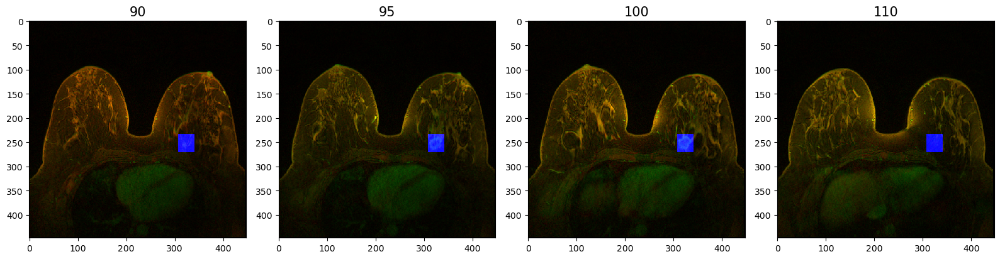

<Figure size 640x480 with 0 Axes>

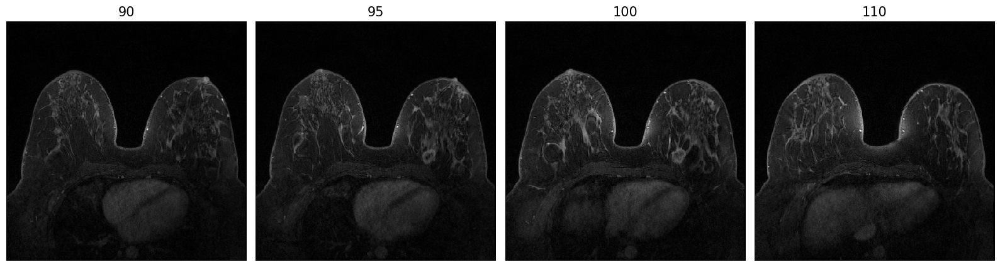

<Figure size 640x480 with 0 Axes>

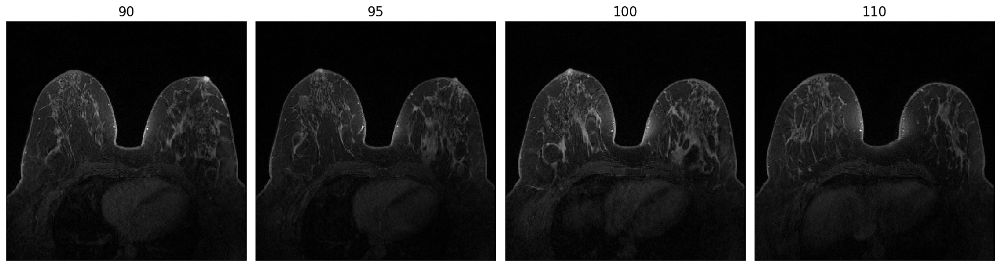

<Figure size 640x480 with 0 Axes>

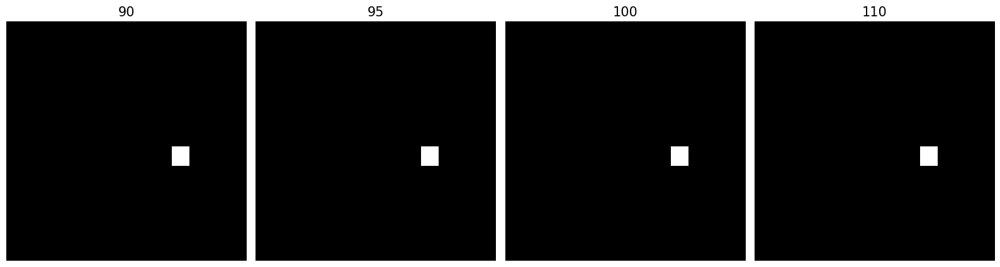

In [141]:

for i in range(1):
    show_n_images([np.stack([minmax(acq[i][k]),
                            minmax(acq[i+1][k]),
                            m[k]],axis=2) for k in idx], titles=[str(k) for k in idx],
                  axis_off=False)
    show_n_images([acq[i+1][k] for k in idx], titles=[str(k) for k in idx])
    show_n_images([acq[-1][k] for k in idx], titles=[str(k) for k in idx])
    show_n_images([m[k] for k in idx], titles=[str(k) for k in idx])

In [142]:
sraw=251
eraw=294

scol=108
ecol=136

sslc=59
eslc=72

In [151]:
idx=[60,65,70]
#idx=[174-k for k in idx]
idx

[60, 65, 70]

In [152]:
acq=d[1]
acq[0].shape

(142, 512, 512)

In [153]:
m=np.zeros(acq[0].shape)
m[sslc:eslc, sraw:eraw,  scol:ecol]=1

<Figure size 640x480 with 0 Axes>

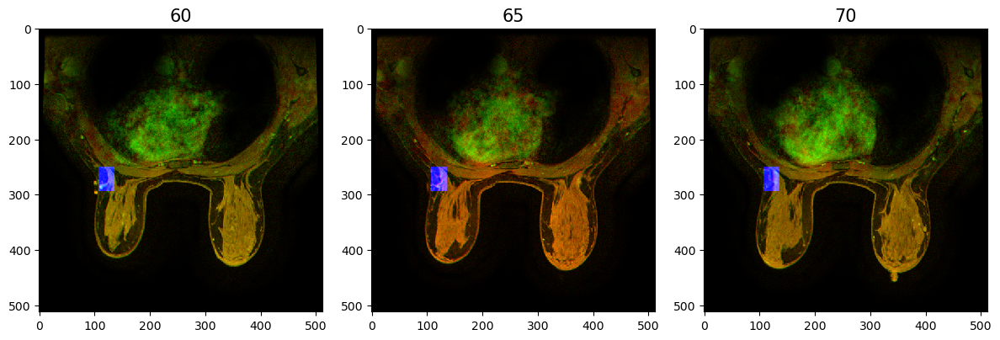

<Figure size 640x480 with 0 Axes>

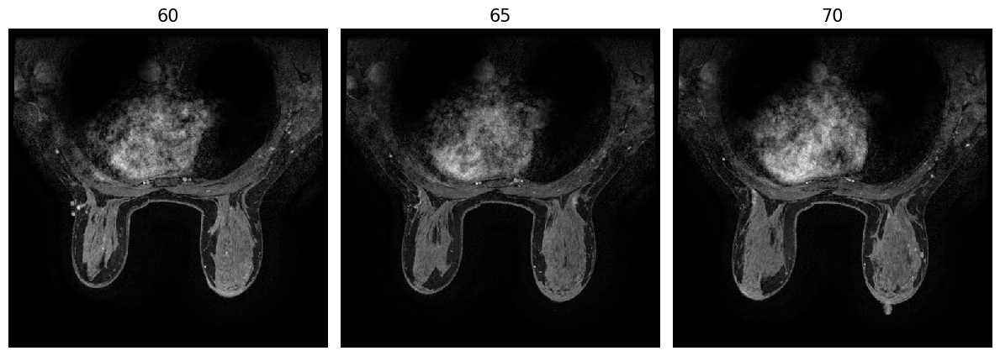

In [155]:

for i in range(1):
    show_n_images([np.stack([minmax(acq[i][k]),
                            minmax(acq[i+1][k]),
                            m[k]],axis=2) for k in idx], titles=[str(k) for k in idx],
                  axis_off=False)
    show_n_images([acq[i+1][k] for k in idx], titles=[str(k) for k in idx])
    

In [156]:
p4='Breast_MRI_652'
#220.0	334.0	369.0	443.0	15.0	96.0

In [157]:
sraw=220
eraw=334

scol=369
ecol=443

sslc=15
eslc=96

In [ ]:
m=np.zeros(d[0].shape)
m[sslc:eslc, sraw:eraw,  scol:ecol]=1

<Figure size 640x480 with 0 Axes>

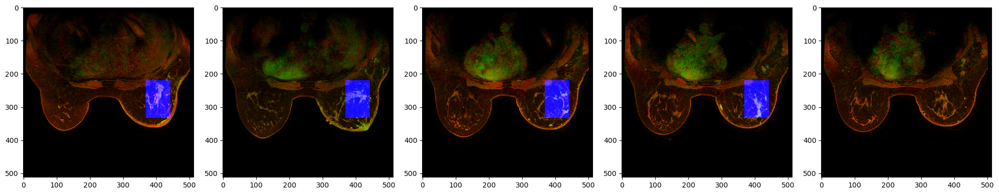

<Figure size 640x480 with 0 Axes>

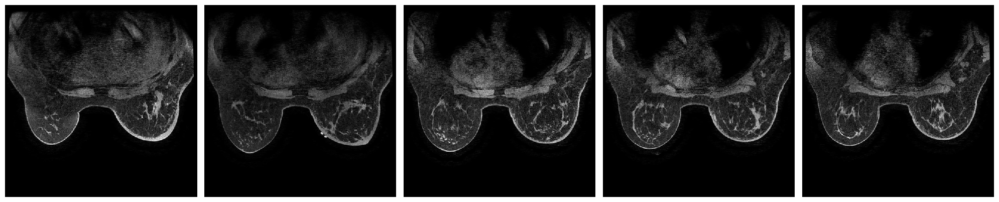

<Figure size 640x480 with 0 Axes>

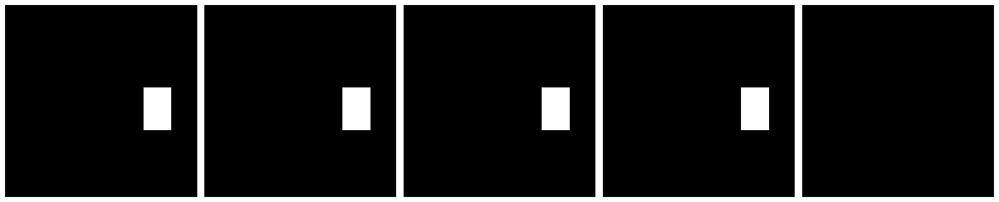

<Figure size 640x480 with 0 Axes>

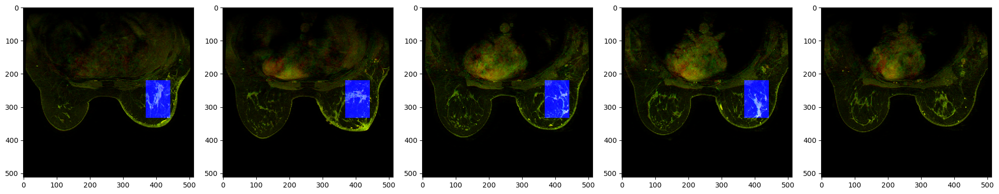

<Figure size 640x480 with 0 Axes>

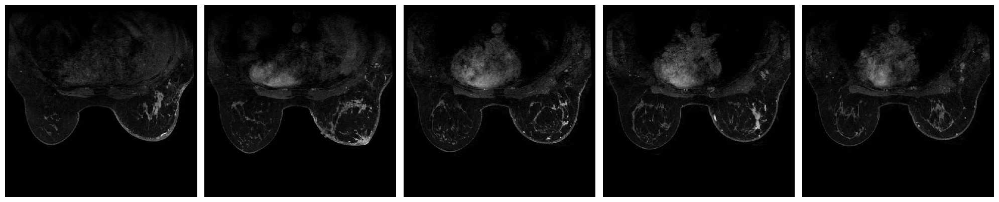

<Figure size 640x480 with 0 Axes>

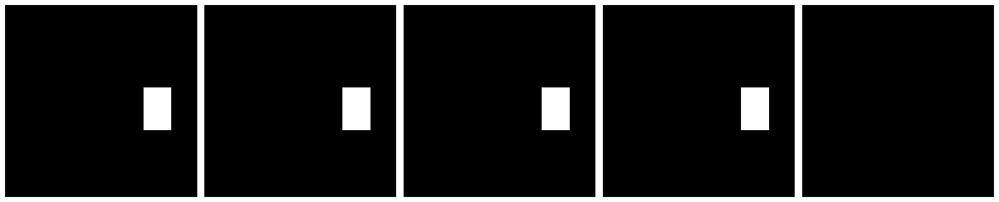

<Figure size 640x480 with 0 Axes>

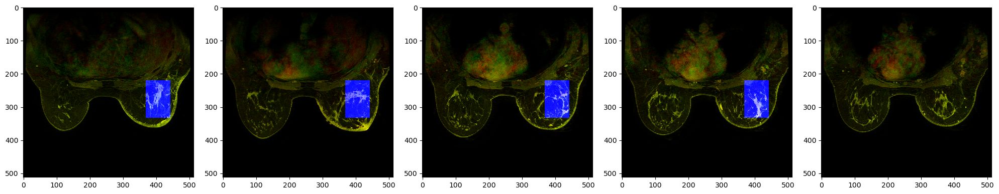

<Figure size 640x480 with 0 Axes>

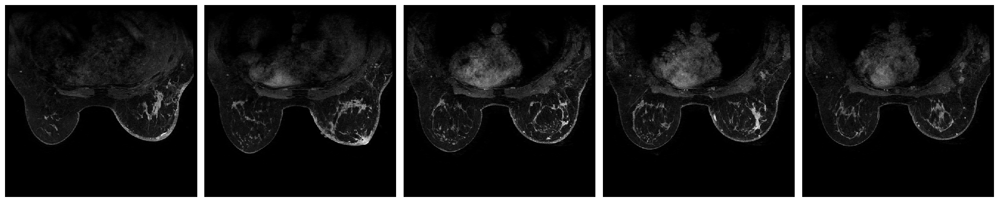

<Figure size 640x480 with 0 Axes>

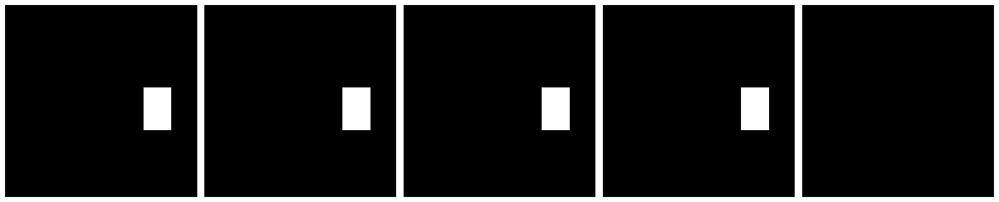

In [ ]:
idx=[30,50,80,90,100]
for i in range(3):
    show_n_images([np.stack([minmax(d[i][k]),
                            minmax(d[i+1][k]),
                            m[k]],axis=2) for k in idx],axis_off=False)
    show_n_images([d[i][k] for k in idx])
    show_n_images([m[k] for k in idx])

In [ ]:
p3='Breast_MRI_597'  #acq0_increas=0

In [ ]:
sraw=281
eraw=387

scol=333
ecol=455

sslc=101
eslc=140

In [ ]:
d=[]
for i in range(4):
    dd=get_nifti_acq(p3,idx=i)
    d.append(dd)
d[0].shape

(190, 512, 512)

In [ ]:
m=np.zeros(d[0].shape)
m[sslc:eslc, sraw:eraw,  scol:ecol]=1

<Figure size 640x480 with 0 Axes>

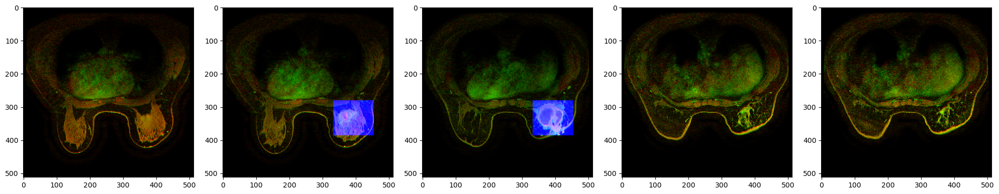

<Figure size 640x480 with 0 Axes>

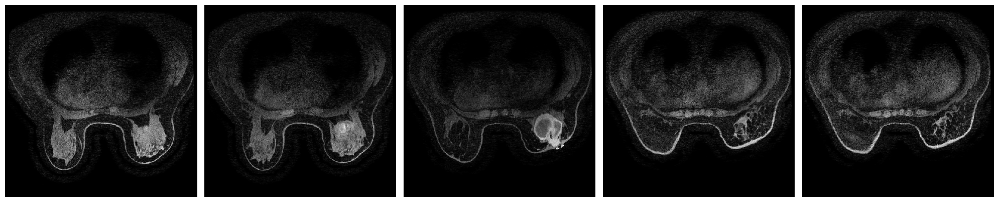

<Figure size 640x480 with 0 Axes>

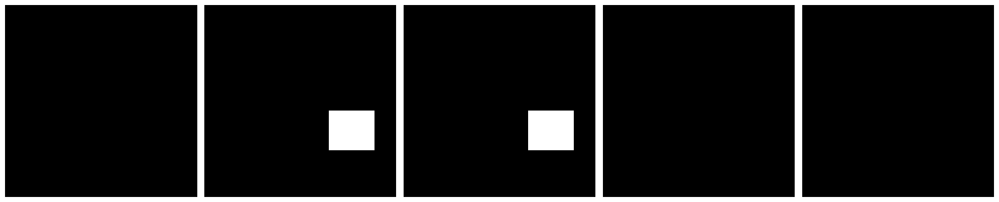

<Figure size 640x480 with 0 Axes>

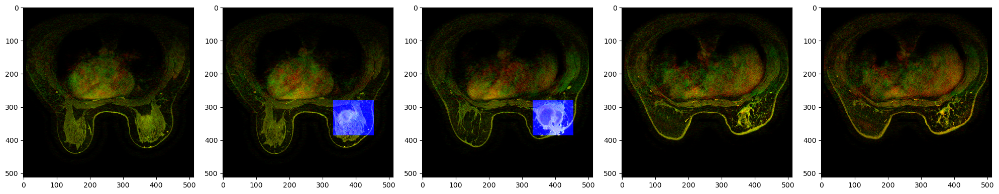

<Figure size 640x480 with 0 Axes>

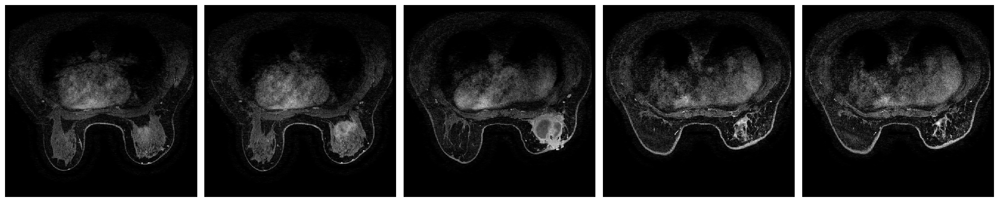

<Figure size 640x480 with 0 Axes>

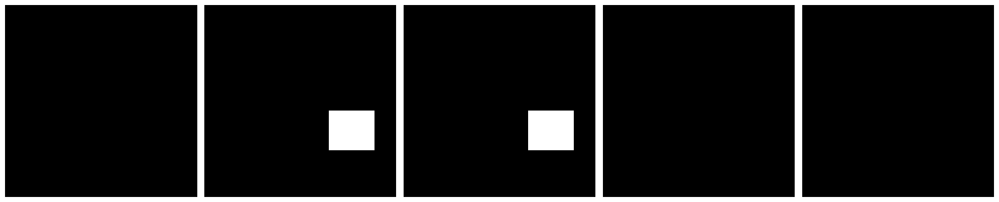

<Figure size 640x480 with 0 Axes>

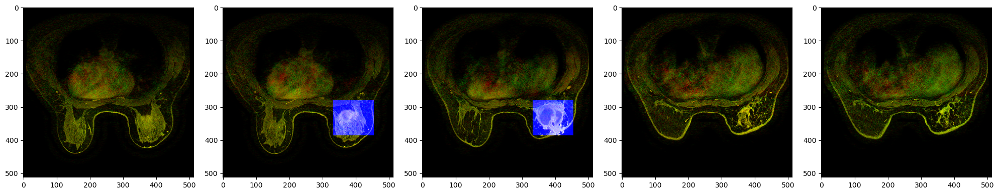

<Figure size 640x480 with 0 Axes>

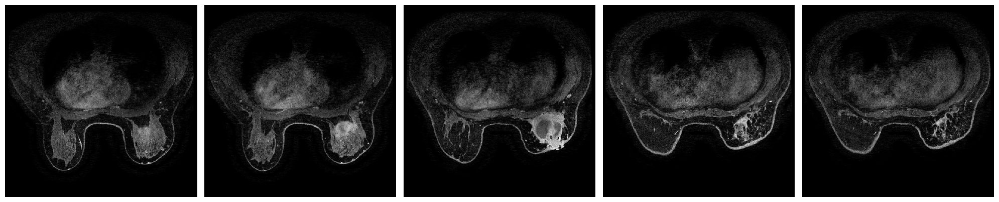

<Figure size 640x480 with 0 Axes>

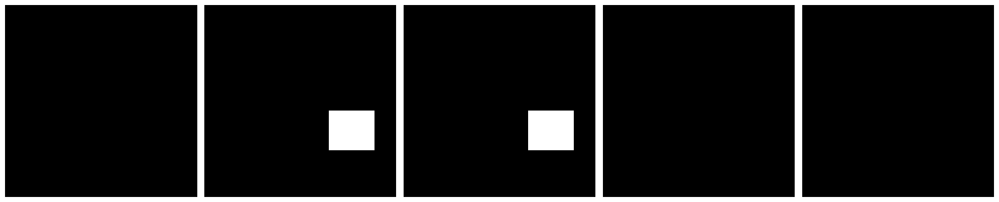

In [ ]:
idx=[100,105,130,140,141]
for i in range(3):
    show_n_images([np.stack([minmax(d[i][k]),
                            minmax(d[i+1][k]),
                            m[k]],axis=2) for k in idx],axis_off=False)
    show_n_images([d[i][k] for k in idx])
    show_n_images([m[k] for k in idx])

# Save jpg niftii samplesa

In [24]:
create_jpg_and_sample=True

In [140]:
df[df.columns[:80]].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2064 entries, 0 to 2063
Data columns (total 80 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   pid                      2064 non-null   object 
 1   pCR                      1420 non-null   float64
 2   n_xy                     2064 non-null   float64
 3   n_z                      2064 non-null   float64
 4   n_times                  2064 non-null   float64
 5   pre                      2064 non-null   float64
 6   post_early               2064 non-null   float64
 7   post_late                2064 non-null   float64
 8   slice_thick              2064 non-null   float64
 9   xy_spacing               2058 non-null   float64
 10  mask_start               2060 non-null   float64
 11  mask_end                 2060 non-null   float64
 12  mask_count               2060 non-null   float64
 13  mask_max                 2060 non-null   float64
 14  sraw                    

In [141]:
nifti_dcm_path

'drive/MyDrive/breast_mri/DUKE/dce/'

In [25]:
nifti_dcm_new_path#='drive/MyDrive/new_breast_mri/DUKE/dce/'

NameError: name 'nifti_dcm_new_path' is not defined

In [41]:
df=pd.read_csv('df_all_with_pred_new_test_v10.csv')

In [64]:
df[df.columns[:80]].info()

<class 'pandas.core.frame.DataFrame'>
Index: 2064 entries, 0 to 919
Data columns (total 80 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   pid                      2064 non-null   object 
 1   pCR                      1420 non-null   float64
 2   n_xy                     2064 non-null   float64
 3   n_z                      2064 non-null   float64
 4   n_times                  2064 non-null   float64
 5   pre                      2064 non-null   float64
 6   post_early               2064 non-null   float64
 7   post_late                2064 non-null   float64
 8   slice_thick              2064 non-null   float64
 9   xy_spacing               2058 non-null   float64
 10  mask_start               2060 non-null   float64
 11  mask_end                 2060 non-null   float64
 12  mask_count               2060 non-null   float64
 13  mask_max                 2060 non-null   float64
 14  sraw                     2060 

In [83]:
nifti_dcm_new_path='G:/My Drive/breast_mri/DUKE/min_dce/'

In [33]:
rdirif pid not in ['Breast_MRI_700',
                       'Breast_MRI_728',
                       'Breast_MRI_801',
                  'Breast_MRI_893']: #'Breast_MRI_103', 'Breast_MRI_164']:
            continue

'./duke/jpg_d'

In [125]:
if create_jpg_and_sample:

    results = []

    # Iterate through DataFrame rows
    for i, row in df[(df.dataset=='duke')&(df.pCR.isna())].iterrows():
        
        # Process each acquisition column
        if i<696 : continue
        print(row[['pid','dataset','test','mask_start','mask_end']])
        pid =  row['pid']
        n_times=int(row['n_z'])
        i0=int(row['pre'])
        i1=int(row['post_early'])
        i2=int(row['post_late'])
        startm=int(row['mask_start'])
        endm=int(row['mask_end'])

        print(i, '---',pid)

        a0=get_nifti_acq(pid, nifti_dcm_path,idx=i0)
        a1=get_nifti_acq(pid, nifti_dcm_path,idx=i1)
        a2=get_nifti_acq(pid, nifti_dcm_path,idx=i2)
        
        
        fn = pid+'_duke_aqc_'+str(i0)+'.nii.gz'
        save_nifti(os.path.join(nifti_dcm_new_path, fn),
                   a0[startm-2:endm+2])
        fn = pid+'_duke_aqc_'+str(i1)+'.nii.gz'

        save_nifti(os.path.join(nifti_dcm_new_path, fn),
                   a1[startm-2:endm+2])
        fn = pid+'_duke_aqc_'+str(i2)+'.nii.gz'
        save_nifti(os.path.join(nifti_dcm_new_path, fn),
                   a2[startm-2:endm+2])
        df.at[i,'save_from']=startm-2
        df.at[i,'save_to']=endm+2
        
        for k in range(startm-2, endm+2,1):

            mfname = pid+'_'+str(k)+'.jpg'

            imf = np.zeros((a0.shape[1],
                            a0.shape[1], 3), np.float64)

            
            
            imf[:,:,0] = minmax(a0[k])
            imf[:,:,1] = minmax(a1[k])
            imf[:,:,2] = minmax(a2[k])

            imf = (imf*255).astype(np.uint8)

            fdir = os.path.join(rdir, pid)
            os.makedirs(fdir, exist_ok=True)
            plt.imsave(os.path.join(fdir,   mfname), imf)

            imf = np.zeros((a0.shape[1],
                            a0.shape[1], 3), np.float64)
            imf[:,:,0] =a0[k]
            imf[:,:,1] = a1[k]
            imf[:,:,2] = a2[k]
            imf = minmax(imf)
            imf = (imf*255).astype(np.uint8)
            
            fdir = os.path.join(rdir+'b', pid)
            os.makedirs(fdir, exist_ok=True)
            plt.imsave(os.path.join(fdir,   mfname), imf)

            if k==startm+endm//2:
                plt.imsave(os.path.join(sample_dir,   mfname), imf)



pid           Breast_MRI_699
dataset                 duke
test                     1.0
mask_start             100.0
mask_end               111.0
Name: 696, dtype: object
696 --- Breast_MRI_699
pid           Breast_MRI_701
dataset                 duke
test                     1.0
mask_start              61.0
mask_end               116.0
Name: 698, dtype: object
698 --- Breast_MRI_701
pid           Breast_MRI_702
dataset                 duke
test                     1.0
mask_start              41.0
mask_end                51.0
Name: 699, dtype: object
699 --- Breast_MRI_702
pid           Breast_MRI_703
dataset                 duke
test                     0.0
mask_start              86.0
mask_end               142.0
Name: 700, dtype: object
700 --- Breast_MRI_703
pid           Breast_MRI_704
dataset                 duke
test                     0.0
mask_start               1.0
mask_end                69.0
Name: 701, dtype: object
701 --- Breast_MRI_704
pid           Breast_MRI_705
datase

pid           Breast_MRI_752
dataset                 duke
test                     0.0
mask_start             115.0
mask_end               125.0
Name: 749, dtype: object
749 --- Breast_MRI_752
pid           Breast_MRI_753
dataset                 duke
test                     0.0
mask_start              61.0
mask_end                84.0
Name: 750, dtype: object
750 --- Breast_MRI_753
pid           Breast_MRI_755
dataset                 duke
test                     0.0
mask_start              86.0
mask_end                98.0
Name: 752, dtype: object
752 --- Breast_MRI_755
pid           Breast_MRI_756
dataset                 duke
test                     0.0
mask_start              35.0
mask_end                52.0
Name: 753, dtype: object
753 --- Breast_MRI_756
pid           Breast_MRI_759
dataset                 duke
test                     0.0
mask_start              99.0
mask_end               109.0
Name: 756, dtype: object
756 --- Breast_MRI_759
pid           Breast_MRI_760
datase

pid           Breast_MRI_814
dataset                 duke
test                     0.0
mask_start              68.0
mask_end               119.0
Name: 811, dtype: object
811 --- Breast_MRI_814
pid           Breast_MRI_815
dataset                 duke
test                     0.0
mask_start             101.0
mask_end               122.0
Name: 812, dtype: object
812 --- Breast_MRI_815
pid           Breast_MRI_816
dataset                 duke
test                     0.0
mask_start             134.0
mask_end               145.0
Name: 813, dtype: object
813 --- Breast_MRI_816
pid           Breast_MRI_818
dataset                 duke
test                     0.0
mask_start              93.0
mask_end               141.0
Name: 815, dtype: object
815 --- Breast_MRI_818
pid           Breast_MRI_819
dataset                 duke
test                     0.0
mask_start              25.0
mask_end                48.0
Name: 816, dtype: object
816 --- Breast_MRI_819
pid           Breast_MRI_820
datase

pid           Breast_MRI_870
dataset                 duke
test                     0.0
mask_start             111.0
mask_end               117.0
Name: 867, dtype: object
867 --- Breast_MRI_870
pid           Breast_MRI_871
dataset                 duke
test                     0.0
mask_start              95.0
mask_end               104.0
Name: 868, dtype: object
868 --- Breast_MRI_871
pid           Breast_MRI_872
dataset                 duke
test                     0.0
mask_start              49.0
mask_end                55.0
Name: 869, dtype: object
869 --- Breast_MRI_872
pid           Breast_MRI_873
dataset                 duke
test                     2.0
mask_start              76.0
mask_end               107.0
Name: 870, dtype: object
870 --- Breast_MRI_873
pid           Breast_MRI_875
dataset                 duke
test                     0.0
mask_start              89.0
mask_end               111.0
Name: 872, dtype: object
872 --- Breast_MRI_875
pid           Breast_MRI_876
datase

In [126]:
df.to_csv('df_all_with_pred_new_test_v10_a.csv', index = False)

In [91]:
df_masks[df_masks['Patient ID']=='Breast_MRI_699']

,Patient ID,Start Row,End Row,Start Column,End Column,Start Slice,End Slice
698,Breast_MRI_699,333,361,114,147,100,111


In [97]:
df[['pid','pCR','dataset','test','mask_start','mask_end']][df.pid=='Breast_MRI_699']

,pid,pCR,dataset,test,mask_start,mask_end
696,Breast_MRI_699,NaN,duke,1.0,100.0,111.0


In [100]:
df[['pid','pCR','dataset','test','mask_start','mask_end']].info()

<class 'pandas.core.frame.DataFrame'>
Index: 2064 entries, 0 to 919
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   pid         2064 non-null   object 
 1   pCR         1420 non-null   float64
 2   dataset     2064 non-null   object 
 3   test        2064 non-null   float64
 4   mask_start  2060 non-null   float64
 5   mask_end    2060 non-null   float64
dtypes: float64(4), object(2)
memory usage: 177.4+ KB


In [103]:
jj=df[df.mask_start.isna()].pid.values

In [104]:
df_masks[df_masks['Patient ID'].isin(jj)]

,Patient ID,Start Row,End Row,Start Column,End Column,Start Slice,End Slice
699,Breast_MRI_700,129,172,310,338,86,113
727,Breast_MRI_728,155,183,120,151,78,89
800,Breast_MRI_801,178,207,316,342,71,96
892,Breast_MRI_893,231,248,343,358,84,89


In [102]:
df[df.mask_start.isna()][['pid','pCR','dataset','test','mask_start','mask_end']]

,pid,pCR,dataset,test,mask_start,mask_end
697,Breast_MRI_700,NaN,duke,1.0,NaN,NaN
725,Breast_MRI_728,NaN,duke,2.0,NaN,NaN
798,Breast_MRI_801,NaN,duke,2.0,NaN,NaN
890,Breast_MRI_893,NaN,duke,0.0,NaN,NaN


In [ ]:
!ls drive/MyDrive/breast_mri/DUKE/dce/ACRIN-6698-102212_duke_aqc*

In [ ]:
if create_jpg_and_sample:

    results = []

    # Iterate through DataFrame rows
    for i, row in df.iterrows():
        # Process each acquisition column
        pid =  row['pid']

        '''if pid in ['Breast_MRI_103', 'Breast_MRI_164']:
            continue
        if i<314:
            continue'''
        if pid not in prob_pids:
            continue
        print(i, '---',pid)
        acq=[]

        last_id = int(row['n_tp']-1)
        if last_id>=3:continue

        for k in range(5):

                acq_col='acq'+str(k)
                # Construct full folder path
                if pd.isna(row[acq_col]):
                    if k <3:
                        print('problem', 'k <4',k,folder_path,acq_col)
                    continue

                folder_path = os.path.join(base_path,
                                           row['Patient_ID'],
                                           row['top_folder'],
                                           row[acq_col])
                if not os.path.isdir(folder_path):
                    if k <3:
                        print('problem',' k <4',k, folder_path,acq_col)
                    continue


                # Read DICOM series
                dicom_stack, first_dicom = read_dicom_series(folder_path)

                # Validate shape
                expected_rows = first_dicom.Rows
                expected_cols = first_dicom.Columns

                # Check if stack shape matches expected dimensions
                if dicom_stack.shape[1] != expected_rows or dicom_stack.shape[2] != expected_cols:
                    print('problem')
                    continue

                # Extract voxel sizes
                voxel_sizes = extract_voxel_sizes(first_dicom)

                acq.append(dicom_stack)
                df.loc[i,'voxel_x']=voxel_sizes['voxel_x']
                df.loc[i,'voxel_y']=voxel_sizes['voxel_y']
                df.loc[i,'voxel_z']=voxel_sizes['voxel_z']
                df.loc[i,'nz'] = dicom_stack.shape[0]

                fn = pid+'_duke_aqc_'+str(k)+'.nii.gz'
                save_nifti(os.path.join(nifti_dcm_path, fn),dicom_stack)
        tt = df_masks[df_masks['Patient ID']==pid]

        cc=['Start Row', 'End Row', 'Start Column', 'End Column',
               'Start Slice', 'End Slice']

        df.loc[i,'sraw']=tt[cc[0]].values[0]
        df.loc[i,'eraw']=tt[cc[1]].values[0]
        df.loc[i,'scol']=tt[cc[2]].values[0]
        df.loc[i,'ecol']=tt[cc[3]].values[0]
        df.loc[i,'sslc']=tt[cc[4]].values[0]
        df.loc[i,'eslc']=tt[cc[5]].values[0]

        print(tt[cc[4]].values[0],tt[cc[5]].values[0])

        for k in range(tt[cc[4]].values[0]-1,
                       tt[cc[5]].values[0]+1,1):

            mfname = pid+'_'+str(k)+'.jpg'

            imf = np.zeros((acq[0].shape[1],
                            acq[0].shape[1], 3), np.float64)

            last_id = int(row['n_times']-1)
            if last_id<3:
                print(last_id)
            imf[:,:,0] = minmax(acq[0][k])
            imf[:,:,1] = minmax(acq[1][k])
            imf[:,:,2] = minmax(acq[last_id][k])

            imf = (imf*255).astype(np.uint8)

            plt.imsave(os.path.join(rdir,   mfname), imf)

            imf = np.zeros((acq[0].shape[1],
                            acq[0].shape[1], 3), np.float64)
            imf[:,:,0] = acq[0][k]
            imf[:,:,1] = acq[1][k]
            imf[:,:,2] = acq[last_id][k]
            imf = minmax(imf)
            imf = (imf*255).astype(np.uint8)
            plt.imsave(os.path.join(rdir+'b',   mfname), imf)

            if k==(tt[cc[4]].values[0]+tt[cc[5]].values[0])//2:
                plt.imsave(os.path.join(sample_dir,   mfname), imf)



In [127]:
df[df.columns[:80]].info()

<class 'pandas.core.frame.DataFrame'>
Index: 2060 entries, 0 to 919
Data columns (total 80 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   pid                      2060 non-null   object 
 1   pCR                      1420 non-null   float64
 2   n_xy                     2060 non-null   float64
 3   n_z                      2060 non-null   float64
 4   n_times                  2060 non-null   float64
 5   pre                      2060 non-null   float64
 6   post_early               2060 non-null   float64
 7   post_late                2060 non-null   float64
 8   slice_thick              2060 non-null   float64
 9   xy_spacing               2058 non-null   float64
 10  mask_start               2060 non-null   float64
 11  mask_end                 2060 non-null   float64
 12  mask_count               2060 non-null   float64
 13  mask_max                 2060 non-null   float64
 14  sraw                     2060 

In [77]:
dd = pd.read_csv('df_duke_full_meta_cinical_dcm_data_v5.csv')

In [122]:
if create_jpg_and_sample:

    results = []

    # Iterate through DataFrame rows
    for i, row in df[df.dataset=='duke'].iterrows():
        
        
        # Process each acquisition column
        pid =  row['pid']

        fn = pid+'_duke_aqc_0.nii.gz'
                
        if os.path.exists(os.path.join(nifti_dcm_path, fn)):
            print('exsist:', fn)
            continue
            
        print(i, '---',pid)
        acq=[]

        last_id = int(row['n_times']-1)

        for k in range(6):

                acq_col='acq'+str(k)
                # Construct full folder path
                if pd.isna(row[acq_col]):
                    
                    continue

                top_fold = dd[dd.pid==pid].top_folder.values[0]
                folder_path = os.path.join(base_path,
                                           row['pid'],
                                           top_fold,
                                           row[acq_col])
                if not os.path.isdir(folder_path):
                    
                    print('=====problem',' k <e',k, folder_path,acq_col)
                    break


                # Read DICOM series
                dicom_stack, first_dicom = read_dicom_series(folder_path)

                # Validate shape
                expected_rows = first_dicom.Rows
                expected_cols = first_dicom.Columns

                # Check if stack shape matches expected dimensions
                if dicom_stack.shape[1] != expected_rows or dicom_stack.shape[2] != expected_cols:
                    print('XXXXXXXXXXXXXXXX problem')
                    continue

                # Extract voxel sizes
                voxel_sizes = extract_voxel_sizes(first_dicom)

                acq.append(dicom_stack)
                df.loc[i,'voxel_x']=voxel_sizes['voxel_x']
                df.loc[i,'voxel_y']=voxel_sizes['voxel_y']
                df.loc[i,'voxel_z']=voxel_sizes['voxel_z']
                df.loc[i,'n_z'] = dicom_stack.shape[0]

                fn = pid+'_duke_aqc_'+str(k)+'.nii.gz'
                save_nifti(os.path.join(nifti_dcm_path, fn),dicom_stack)





exsist: Breast_MRI_001_duke_aqc_0.nii.gz
exsist: Breast_MRI_002_duke_aqc_0.nii.gz
exsist: Breast_MRI_005_duke_aqc_0.nii.gz
exsist: Breast_MRI_009_duke_aqc_0.nii.gz
exsist: Breast_MRI_010_duke_aqc_0.nii.gz
exsist: Breast_MRI_012_duke_aqc_0.nii.gz
exsist: Breast_MRI_019_duke_aqc_0.nii.gz
exsist: Breast_MRI_021_duke_aqc_0.nii.gz
exsist: Breast_MRI_022_duke_aqc_0.nii.gz
exsist: Breast_MRI_028_duke_aqc_0.nii.gz
exsist: Breast_MRI_032_duke_aqc_0.nii.gz
exsist: Breast_MRI_040_duke_aqc_0.nii.gz
exsist: Breast_MRI_041_duke_aqc_0.nii.gz
exsist: Breast_MRI_043_duke_aqc_0.nii.gz
exsist: Breast_MRI_044_duke_aqc_0.nii.gz
exsist: Breast_MRI_045_duke_aqc_0.nii.gz
exsist: Breast_MRI_046_duke_aqc_0.nii.gz
exsist: Breast_MRI_048_duke_aqc_0.nii.gz
exsist: Breast_MRI_051_duke_aqc_0.nii.gz
exsist: Breast_MRI_055_duke_aqc_0.nii.gz
exsist: Breast_MRI_056_duke_aqc_0.nii.gz
exsist: Breast_MRI_057_duke_aqc_0.nii.gz
exsist: Breast_MRI_059_duke_aqc_0.nii.gz
exsist: Breast_MRI_060_duke_aqc_0.nii.gz
exsist: Breast_M

exsist: Breast_MRI_093_duke_aqc_0.nii.gz
exsist: Breast_MRI_094_duke_aqc_0.nii.gz
exsist: Breast_MRI_095_duke_aqc_0.nii.gz
exsist: Breast_MRI_096_duke_aqc_0.nii.gz
exsist: Breast_MRI_098_duke_aqc_0.nii.gz
exsist: Breast_MRI_100_duke_aqc_0.nii.gz
exsist: Breast_MRI_102_duke_aqc_0.nii.gz
exsist: Breast_MRI_106_duke_aqc_0.nii.gz
exsist: Breast_MRI_108_duke_aqc_0.nii.gz
exsist: Breast_MRI_109_duke_aqc_0.nii.gz
exsist: Breast_MRI_110_duke_aqc_0.nii.gz
exsist: Breast_MRI_111_duke_aqc_0.nii.gz
exsist: Breast_MRI_112_duke_aqc_0.nii.gz
exsist: Breast_MRI_113_duke_aqc_0.nii.gz
exsist: Breast_MRI_118_duke_aqc_0.nii.gz
exsist: Breast_MRI_121_duke_aqc_0.nii.gz
exsist: Breast_MRI_122_duke_aqc_0.nii.gz
exsist: Breast_MRI_124_duke_aqc_0.nii.gz
exsist: Breast_MRI_125_duke_aqc_0.nii.gz
exsist: Breast_MRI_126_duke_aqc_0.nii.gz
exsist: Breast_MRI_127_duke_aqc_0.nii.gz
exsist: Breast_MRI_128_duke_aqc_0.nii.gz
exsist: Breast_MRI_130_duke_aqc_0.nii.gz
exsist: Breast_MRI_131_duke_aqc_0.nii.gz
exsist: Breast_M

exsist: Breast_MRI_477_duke_aqc_0.nii.gz
exsist: Breast_MRI_478_duke_aqc_0.nii.gz
exsist: Breast_MRI_479_duke_aqc_0.nii.gz
exsist: Breast_MRI_481_duke_aqc_0.nii.gz
exsist: Breast_MRI_483_duke_aqc_0.nii.gz
exsist: Breast_MRI_484_duke_aqc_0.nii.gz
exsist: Breast_MRI_485_duke_aqc_0.nii.gz
exsist: Breast_MRI_487_duke_aqc_0.nii.gz
exsist: Breast_MRI_488_duke_aqc_0.nii.gz
exsist: Breast_MRI_490_duke_aqc_0.nii.gz
exsist: Breast_MRI_492_duke_aqc_0.nii.gz
exsist: Breast_MRI_493_duke_aqc_0.nii.gz
exsist: Breast_MRI_494_duke_aqc_0.nii.gz
exsist: Breast_MRI_495_duke_aqc_0.nii.gz
exsist: Breast_MRI_496_duke_aqc_0.nii.gz
exsist: Breast_MRI_497_duke_aqc_0.nii.gz
exsist: Breast_MRI_498_duke_aqc_0.nii.gz
exsist: Breast_MRI_499_duke_aqc_0.nii.gz
exsist: Breast_MRI_500_duke_aqc_0.nii.gz
exsist: Breast_MRI_502_duke_aqc_0.nii.gz
exsist: Breast_MRI_503_duke_aqc_0.nii.gz
exsist: Breast_MRI_504_duke_aqc_0.nii.gz
exsist: Breast_MRI_505_duke_aqc_0.nii.gz
exsist: Breast_MRI_508_duke_aqc_0.nii.gz
exsist: Breast_M

In [ ]:
Breast_MRI_728,Breast_MRI_700,Breast_MRI_801,Breast_MRI_893

In [124]:
df=df[~df.pid.isin(['Breast_MRI_728','Breast_MRI_700','Breast_MRI_801','Breast_MRI_893'])]

In [114]:
if create_jpg_and_sample:

    results = []

    # Iterate through DataFrame rows
    for i, row in df[df.dataset=='duke'].iterrows():
        pid=row['pid']
        tt = df_masks[df_masks['Patient ID']==pid]

        cc=['Start Row', 'End Row', 'Start Column', 'End Column',
               'Start Slice', 'End Slice']

        df.loc[i,'srow']=tt[cc[0]].values[0]
        df.loc[i,'erow']=tt[cc[1]].values[0]
        df.loc[i,'scol']=tt[cc[2]].values[0]
        df.loc[i,'ecol']=tt[cc[3]].values[0]
        df.loc[i,'mask_start']=tt[cc[4]].values[0]
        df.loc[i,'mask_end']=tt[cc[5]].values[0]

        print(tt[cc[4]].values[0],tt[cc[5]].values[0])





89 112
59 72
76 122
66 91
105 132
47 97
63 97
114 131
48 81
78 146
110 125
71 102
69 100
115 143
72 85
50 82
102 190
89 109
101 113
58 76
137 172
38 94
79 92
114 135
61 102
82 98
114 130
68 95
91 121
113 142
71 144
46 164
73 118
106 144
60 83
72 90
26 43
130 148
63 91
149 171
113 129
117 140
60 96
61 85
44 107
43 50
104 128
105 119
83 95
22 47
141 153
78 98
121 142
93 103
56 79
53 108
56 103
18 62
101 141
57 80
34 75
77 108
90 106
50 76
85 100
74 105
53 79
75 89
57 131
90 121
83 125
37 87
63 102
61 119
65 91
13 59
61 84
38 99
59 93
60 76
66 114
102 155
49 81
62 86
60 85
45 73
131 144
31 93
88 102
97 126
21 58
88 117
83 113
112 130
79 120
36 116
95 111
38 100
117 142
27 47
116 137
44 119
87 102
115 142
56 88
52 86
52 89
51 66
75 105
92 106
49 77
81 102
53 106
81 111
74 104
63 127
74 91
58 78
109 131
72 91
43 82
40 136
66 196
45 79
52 94
89 122
113 130
91 107
68 86
33 88
68 122
65 70
54 99
71 114
61 142
91 116
46 69
52 85
101 113
81 107
31 120
65 86
52 99
71 101
79 113
88 108
95 128
82 9

In [111]:
df[df.columns[:80]].info()

<class 'pandas.core.frame.DataFrame'>
Index: 2064 entries, 0 to 919
Data columns (total 80 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   pid                      2064 non-null   object 
 1   pCR                      1420 non-null   float64
 2   n_xy                     2064 non-null   float64
 3   n_z                      2064 non-null   float64
 4   n_times                  2064 non-null   float64
 5   pre                      2064 non-null   float64
 6   post_early               2064 non-null   float64
 7   post_late                2064 non-null   float64
 8   slice_thick              2064 non-null   float64
 9   xy_spacing               2058 non-null   float64
 10  mask_start               2064 non-null   float64
 11  mask_end                 2064 non-null   float64
 12  mask_count               2060 non-null   float64
 13  mask_max                 2060 non-null   float64
 14  sraw                     2064 

In [71]:
def minmax(x):
    x = (x-x.min())/(x.max()-x.min()).copy()
    return x

def tensor_show(x):
    y = minmax(np.transpose(np.array(x), (1, 2, 0))).copy()
    return y


def img_show(x):
    y = minmax(np.array(x)).copy()
    return y


In [ ]:
df=pd.read_csv('df_spt2_spy1_dukle_full_data_v5.csv')

In [ ]:
out_put_mask_dir="C:\\Users\\naomi\\Downloads\\breast_mri\\duke\\jpg_d"

In [ ]:
sample_dir_moi

'G:\\My Drive\\breast_mri\\DUKE\\sample_mask_on_img\\'

In [ ]:
df.columns

Index(['pid', 'pCR', 'n_xy', 'n_z', 'n_times', 'pre', 'post_early',
       'post_late', 'slice_thick', 'xy_spacing', 'mask_start', 'mask_end',
       'mask_count', 'mask_max', 'sraw', 'eraw', 'scol', 'ecol', 'age',
       'menaopose', 'r_white', 'r_black', 'age_a50', 'HR', 'HER2',
       'HR_HER2_STATUS', 'TripleNeg', 'HER2pos', 'HRposHER2neg', 'MP',
       'Ganitumab', 'Pembrolizumab', 'AMG 386', 'Ganetespib', 'Carboplatin',
       'MK-2206', 'T-DM1', 'Neratinib', 'ABT 888', 'Trastuzumab', 'Paclitaxel',
       'Pertuzumab', 'is_mask', 'test', 'dataset', 'hormon_status', 'source',
       'menopause', 'ER', 'PR', 'tum_stage', 'hist_type', 'Tumor_Grade',
       'Nottingham_grade', 'Bilateral', 'acq0', 'acq1', 'acq2', 'acq3', 'acq4',
       'acq0_increas', 'max_dcm_0', 'dcm_0_n_uniq', 'std_dcm_0', 'mean_dcm_0',
       'max_dcm_1', 'dcm_1_n_uniq', 'std_dcm_1', 'mean_dcm_1', 'max_dcm_2',
       'dcm_2_n_uniq', 'std_dcm_2', 'mean_dcm_2'],
      dtype='object')

In [ ]:
def save_jpg_m(pid, d0, d2, d5, max_i,
             rdir=out_put_mask_dir   #'.\\SPY1\\jpg_spy1'
              ):

    #print('save jpg', d0.shape)

    pp=[]
    not_save=[]
    #mm=get_nifti_mask(pid)

    imf = np.zeros((d0[0].shape[1], d0[0].shape[1], 3), np.float64)
    imf[:,:,0] = minmax(d0[max_i])
    imf[:,:,1] = minmax(d2[max_i])
    imf[:,:,2] = minmax(d5[max_i])
    mfname = pid+'_'+str(int(max_i))+'.jpg'
    plt.imsave(os.path.join(sample_dir,   mfname),
               (imf[:,:,:3]*255).astype(np.uint8))
    mfname = pid+'_'+str(int(max_i))+'_msk.jpg'
    mm=np.zeros((d0[0].shape[1], d0[0].shape[1]))
    mm[int(row['sraw']):int(row['eraw']),int(row['scol']):int(row['ecol'])]
    plt.imsave(os.path.join(sample_dir,   mfname),
               (mm).astype(np.uint8))
    if deb:
        print(imf.shape,imf[0].max(),imf[2].max(),imf[1].max())
        show_n_images([imf, imf[:,:,2], imf[:,:,0], mm])

    imf[:,:,2] = imf[:,:,2]*minmax(mm/5.)

    if deb:
        print(imf.shape,imf[0].max(),imf[2].max(),imf[1].max())
        show_n_images([imf, imf[:,:,2], imf[:,:,0], mm])
    mfname = pid+'_'+str(max_i)+'_wm.jpg'
    plt.imsave(os.path.join(sample_dir_moi,   mfname), imf)

    f =  max(int(row['mask_start'])-2,0)
    l = min(int(row['mask_end']+4), d0[0].shape[1])

    #print('first last', f,l,mm.shape)
    for k in range(f,l,1):

            mfname = pid+'_'+str(int(k))+'.jpg'

            imf = np.zeros((d0[0].shape[1], d0[0].shape[1], 3), np.float64)
            imf[:,:,0] = minmax(d0[k])
            imf[:,:,1] = minmax(d2[k])
            imf[:,:,2] = minmax(d5[k])

            imf = (imf*255).astype(np.uint8)

            plt.imsave(os.path.join(rdir,   mfname), imf)

            imf = np.zeros((d0[0].shape[1], d0[0].shape[1], 3), np.float64)
            imf[:,:,0] = d0[k]
            imf[:,:,1] = d2[k]
            imf[:,:,2] = d5[k]
            imf = minmax(imf)
            imf = (imf*255).astype(np.uint8)
            plt.imsave(os.path.join(rdir+'b',   mfname), imf)


In [ ]:
df.iloc[982 :].head()

,pid,pCR,n_xy,n_z,n_times,pre,post_early,post_late,slice_thick,xy_spacing,...,std_dcm_0,mean_dcm_0,max_dcm_1,dcm_1_n_uniq,std_dcm_1,mean_dcm_1,max_dcm_2,dcm_2_n_uniq,std_dcm_2,mean_dcm_2
982,Breast_MRI_001,0.0,448.0,160.0,5.0,0.0,1.0,4.0,1.1,0.803571,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
983,Breast_MRI_002,0.0,512.0,142.0,4.0,0.0,1.0,3.0,1.3,0.585900,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
984,Breast_MRI_003,NaN,512.0,156.0,5.0,0.0,1.0,4.0,2.0,0.683600,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
985,Breast_MRI_004,NaN,512.0,164.0,4.0,0.0,1.0,3.0,2.0,0.703100,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
986,Breast_MRI_005,1.0,448.0,160.0,4.0,0.0,1.0,3.0,2.0,0.781250,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df.columns

Index(['pid', 'pCR', 'n_xy', 'n_z', 'n_times', 'pre', 'post_early',
       'post_late', 'slice_thick', 'xy_spacing', 'mask_start', 'mask_end',
       'mask_count', 'mask_max', 'sraw', 'eraw', 'scol', 'ecol', 'age',
       'menaopose', 'r_white', 'r_black', 'age_a50', 'HR', 'HER2',
       'HR_HER2_STATUS', 'TripleNeg', 'HER2pos', 'HRposHER2neg', 'MP',
       'Ganitumab', 'Pembrolizumab', 'AMG 386', 'Ganetespib', 'Carboplatin',
       'MK-2206', 'T-DM1', 'Neratinib', 'ABT 888', 'Trastuzumab', 'Paclitaxel',
       'Pertuzumab', 'is_mask', 'test', 'dataset', 'hormon_status', 'source',
       'menopause', 'ER', 'PR', 'tum_stage', 'hist_type', 'Tumor_Grade',
       'Nottingham_grade', 'Bilateral', 'acq0', 'acq1', 'acq2', 'acq3', 'acq4',
       'acq0_increas', 'max_dcm_0', 'dcm_0_n_uniq', 'std_dcm_0', 'mean_dcm_0',
       'max_dcm_1', 'dcm_1_n_uniq', 'std_dcm_1', 'mean_dcm_1', 'max_dcm_2',
       'dcm_2_n_uniq', 'std_dcm_2', 'mean_dcm_2'],
      dtype='object')

In [ ]:
cc=['pid', 'pCR', 'n_xy', 'n_z', 'n_times', 'pre', 'post_early',
       'post_late', 'slice_thick', 'xy_spacing', 'mask_start', 'mask_end',
       'mask_count', 'mask_max', 'sraw', 'eraw', 'scol', 'ecol']

df.at[982, ]

In [ ]:
deb=0

In [ ]:
    #if create_jpg_and_sample:

    results = []

    # Iterate through DataFrame rows
    for i, row in df[(df.dataset=='duke')].iterrows():
        # Process each acquisition column
        pid =  row['pid']
        #if i < 262 : continue

        '''if pid in ['Breast_MRI_700','Breast_MRI_728','Breast_MRI_801',
                  'Breast_MRI_893']: #'Breast_MRI_103', 'Breast_MRI_164']:
            continue'''
        if i<1696:   continue
        '''if pid not in prob_pids:
            continue'''
        print(i, '---',pid)
        max_i = int((row['mask_start']+row ['mask_end']))//2

        last_id = int(row['n_times'])-1
        print(pid,last_id)

        d0 = get_nifti_acq(pid,idx=0)
        d1 = get_nifti_acq(pid,idx=1)
        dl = get_nifti_acq(pid,idx=last_id)
        acq=[d0,d1,dl]

        df.at[i,'max_dcm_0']=d0.max()
        #df.at[i,'min_dcm_0']=imtif0.min()
        df.at[i,'dcm_0_n_uniq']=len(set(d0.flatten()))
        df.at[i,'std_dcm_0']=d0.std()
        df.at[i,'mean_dcm_0']=d0.mean()

        df.at[i,'max_dcm_1']=d1.max()
        #df.at[i,'min_dcm_1']=imtif2.min()
        df.at[i,'dcm_1_n_uniq']=len(set(d1.flatten()))
        df.at[i,'std_dcm_1']=d1.std()
        df.at[i,'mean_dcm_1']=d1.mean()

        df.at[i,'max_dcm_2']=dl.max()
        #df.at[i,'min_dcm_2']=imtif5.min()
        df.at[i,'dcm_2_n_uniq']=len(set(dl.flatten()))
        df.at[i,'std_dcm_2']=dl.std()
        df.at[i,'mean_dcm_2']=dl.mean()

        save_jpg_m(pid,d0,d1,dl,int(max_i))



1696 --- Breast_MRI_718
Breast_MRI_718 3
1697 --- Breast_MRI_719
Breast_MRI_719 4
1698 --- Breast_MRI_720
Breast_MRI_720 4
1699 --- Breast_MRI_721
Breast_MRI_721 4
1700 --- Breast_MRI_722
Breast_MRI_722 3
1701 --- Breast_MRI_723
Breast_MRI_723 4
1702 --- Breast_MRI_724
Breast_MRI_724 3
1703 --- Breast_MRI_725
Breast_MRI_725 3
1704 --- Breast_MRI_726
Breast_MRI_726 4
1705 --- Breast_MRI_727
Breast_MRI_727 4
1706 --- Breast_MRI_729
Breast_MRI_729 3
1707 --- Breast_MRI_730
Breast_MRI_730 3
1708 --- Breast_MRI_731
Breast_MRI_731 3
1709 --- Breast_MRI_732
Breast_MRI_732 4
1710 --- Breast_MRI_733
Breast_MRI_733 4
1711 --- Breast_MRI_734
Breast_MRI_734 3
1712 --- Breast_MRI_735
Breast_MRI_735 4
1713 --- Breast_MRI_736
Breast_MRI_736 4
1714 --- Breast_MRI_737
Breast_MRI_737 3
1715 --- Breast_MRI_738
Breast_MRI_738 3
1716 --- Breast_MRI_739
Breast_MRI_739 4
1717 --- Breast_MRI_740
Breast_MRI_740 4
1718 --- Breast_MRI_741
Breast_MRI_741 3
1719 --- Breast_MRI_742
Breast_MRI_742 4
1720 --- Breast_

1896 --- Breast_MRI_921
Breast_MRI_921 3
1897 --- Breast_MRI_922
Breast_MRI_922 3


In [ ]:
    #if create_jpg_and_sample:

    results = []

    # Iterate through DataFrame rows
    for i, row in df[(df.dataset=='duke') & (df.max_dcm_0.isna())].iterrows():
        # Process each acquisition column
        pid =  row['pid']
        #if i < 262 : continue

        if pid not in ['Breast_MRI_700',
                       'Breast_MRI_728',
                       'Breast_MRI_801',
                  'Breast_MRI_893']: #'Breast_MRI_103', 'Breast_MRI_164']:
            continue
        #if i<1872:   continue
        '''if pid not in prob_pids:
            continue'''
        print(i, '---',pid)

        d0 = get_nifti_acq(pid,idx=0)

        max_i = d0[0].shape[0]//2

        last_id = int(row['n_times'])-1
        print(pid,last_id)

        d0 = get_nifti_acq(pid,idx=0)
        d1 = get_nifti_acq(pid,idx=1)
        dl = get_nifti_acq(pid,idx=last_id)
        acq=[d0,d1,dl]

        df.at[i,'max_dcm_0']=d0.max()
        #df.at[i,'min_dcm_0']=imtif0.min()
        df.at[i,'dcm_0_n_uniq']=len(set(d0.flatten()))
        df.at[i,'std_dcm_0']=d0.std()
        df.at[i,'mean_dcm_0']=d0.mean()

        df.at[i,'max_dcm_1']=d1.max()
        #df.at[i,'min_dcm_1']=imtif2.min()
        df.at[i,'dcm_1_n_uniq']=len(set(d1.flatten()))
        df.at[i,'std_dcm_1']=d1.std()
        df.at[i,'mean_dcm_1']=d1.mean()

        df.at[i,'max_dcm_2']=dl.max()
        #df.at[i,'min_dcm_2']=imtif5.min()
        df.at[i,'dcm_2_n_uniq']=len(set(dl.flatten()))
        df.at[i,'std_dcm_2']=dl.std()
        df.at[i,'mean_dcm_2']=dl.mean()

        save_jpg_m(pid,d0,d1,dl,int(max_i))



1780 --- Breast_MRI_801


FileNotFoundError: No such file or no access: 'G:/My Drive/breast_mri/DUKE/dce/Breast_MRI_801_duke_aqc_0.nii.gz'

In [ ]:
df[df.pid=='Breast_MRI_893'][cc]

,pid,pCR,n_xy,n_z,n_times,pre,post_early,post_late,slice_thick,xy_spacing,mask_start,mask_end,mask_count,mask_max,sraw,eraw,scol,ecol
1872,Breast_MRI_893,NaN,448.0,160.0,3.0,0.0,1.0,2.0,1.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df[df.pid=='Breast_MRI_728'][cc]

,pid,pCR,n_xy,n_z,n_times,pre,post_early,post_late,slice_thick,xy_spacing,mask_start,mask_end,mask_count,mask_max,sraw,eraw,scol,ecol
1707,Breast_MRI_728,NaN,448.0,208.0,3.0,0.0,1.0,2.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
missing datA: Breast_MRI_700

In [ ]:
len(d0),max_i

In [ ]:
'Breast_MRI_700',
                       'Breast_MRI_728',
                       'Breast_MRI_801',
                  'Breast_MRI_893'

In [ ]:
df_rem=df[df.isin(['Breast_MRI_700',
                       'Breast_MRI_728',
                       'Breast_MRI_801',
                  'Breast_MRI_893'])].copy()

In [ ]:
df=df[~df.isin(['Breast_MRI_700',
                       'Breast_MRI_728',
                       'Breast_MRI_801',
                  'Breast_MRI_893'])]

In [ ]:
df['mask_end'] = df['mask_end'].apply(lambda x:x+1)

In [ ]:
df.to_csv('FINAL/df_spt2_spy1_dukle_full_data_v5.csv', index = False)

In [ ]:
df.to_csv('df_spt2_spy1_dukle_full_data_v5.csv', index = False)